<a href="https://colab.research.google.com/github/ColstonBod-oy/bing-images-preprocessing/blob/main/Sample_Image_Scraper_and_Preprocessing_using_iCrawler_and_OpenCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Sample Image Scraper**

This is a sample image scraper that allows you to collect images from popular search engines like "Bing". This uses a different library and will allow us to gather images from search engines using the same program.

The documentation for the library can be found here: https://icrawler.readthedocs.io/en/latest/builtin.html

This Google Colab file goes over the basic features for crawling images in various search engines. **Be sure to click "File" > "Save a Copy in Drive" before making any modifications or running the code below.**



---



**The first step is to import the library and its dependencies into our Python directory.** We will make use of the command line below in order to get the tools that we will be using from this code.

In [1]:
!pip install icrawler

**Keep in mind that your own system might display different text if you have not installed this library before.** As long as the last message says that the installation is successful and there are no errors, we can proceed.

**Once we have our library installed, its time to import the required tools into Python.** We will be importing a bit more libraries than we need just in case, but these are all the basic methods we will be using for our code to work.
1. The first library is DateTime which is used for date related functions. We can use this to help label our images, but it is not necessary for now.
2. The second library is the iCrawler library which is a fairly popular tool for image scraping using popular search engines.
3. The third library is for Google Colab, to allow us to store images in this instance of a colaboratory file, so that we can download the images later.
4. The fourth library is Pathlib, for defining the folder paths we will be storing our images in.
5. The fifth library is OS, which is used for creating and managing folders in Google Drive and Google Colab.

In [2]:
from datetime import date
from icrawler.builtin import BingImageCrawler
from google.colab import drive
from pathlib import Path
import os.path
from os import path

**Before we start scraping, we need to define the folders that we will be storing images in.** Make sure these are descriptive so that you can easily identify the content of each folder. You can rename these to a new name for each folder so that you can store different content on the correct folder.

You can find the folders that have been created in the "Files" located on the left hand side. **If you click the small folder icon of the left hand side of the screen, you can see folders that have been created for this session and the images we have downloaded so far.** This is our various folders have been stored and created.

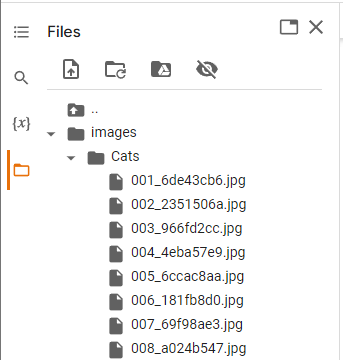

These images are temporarily stored on Google Colab while our instance is active, so make sure to download before the instance closes to not lose any files.

In [3]:
if path.exists('/content/images') == False:
  os.mkdir('/content/images')
  os.mkdir('/content/images/deep_sea_fish_images')
root = Path.cwd()/"images"

**The code below allows us to scrape Bing Images for our chosen keywords or tags.** Have a look at the code and modify the keywords and number of images downloaded as needed. Make sure to input the correct folder path that the images will be stored in as well.

In [4]:
# This is the Bing Crawler tool, which also contains the folder path where images will be stored.
bing_crawler = BingImageCrawler(downloader_threads=4, storage={'root_dir': '/content/images/deep_sea_fish_images'})

# This function specifies the keyword to search along with how many images to download.
bing_crawler.crawl(keyword='deep sea fish', filters=None, max_num=5, file_idx_offset='auto')

ERROR:downloader:Response status code 403, file https://preview.redd.it/bu1rx5xek1721.jpg


**We can then create a zip file and download our scraped iamges.** The images can be inspected, saved or used for data mining.

In [ ]:
# This is the name of the zip file that will be downloaded. We will be storing all our images here.
ZIP_NAME = "image_set.zip"

# These commands tell colab to place all the content in our "Files" on the left hand side into the zip file.
# It then stores the zip file in the "Files" for later use.
# Take note that this ignores the "sample_data" folder since that is automatically generated by colab.
!rm -f {ZIP_NAME}
!zip -q -r {ZIP_NAME} {root}

**The last step in the process is to download the images.** Make sure you place the correct file name so that it will work.

In [ ]:
# This code takes the zip file and downloads it.
from google.colab import files
files.download(ZIP_NAME)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**And that's it! You can now crawl for images on different Search Engines.** For the next steps, try changing the search terms, number of images, and maybe adding filters. You can check the documentation for this library to see what other search engines or websites you can crawl through.

# **Image Preprocessing with Python using the OpenCV Library**

OpenCV (Open Source Computer Vision Library: http://opencv.org) is a very powerful open source library of various computer vision algorithms.

These algorithms are used to process different types of computer media, such as images, videos, 2D and 3D objects, and even GUI. It is originally built as a C++ API, but has a set of Python tools and commands for various computer vision tasks. **Keep in mind that the commands for the C++ version are different from the tools for the Python version.**

***Kindly go over the OpenCV Image Preprocessing tools (direct link here: https://docs.opencv.org/4.x/d2/d96/tutorial_py_table_of_contents_imgproc.html) that we will be exploring for computer vision. These tools are very powerful but also very technical in nature, so please take the time to experiment and understand how these are used to process and extract different type of image data.***

**Make sure you click "File" > "Save a Copy in Drive" before making any modifications or running the code below.**

# Importing our Libraries

**We start by importing all the required libraries and tools that we will be needed for our code to work.** We will not be using all of these libraries, but we will place them here in case they will be used for additional tools or techniques that might be added later on.

***These are the key libraries to take note of:***
1. **import numpy as np**: This imports the numpy library, which is not the focus of this activity but is a very important tool for processing numerical data, and will help us with our image processing tasks. We rename it to **np** to make it easier to refer to in our code.
2. **import cv2 as cv**: This imports the OpenCV library into our colab application so that we can use all the tools needed for image preprocessing. We rename it to **cv** so that it is easier to refer to it in our code.
3. **from google.colab.patches import cv2_imshow**: This is an additional set of code that allows us to view the images that we have uploaded on colab.
4. **from google.colab import drive** and **from google.colab import files**: These two are used for mounting and connecting our Google Drive to Colab so that we can import files and folders directly into our application.



In [8]:
import os
import PIL
import PIL.Image
from PIL import Image
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow
from google.colab import drive
from google.colab import files
from matplotlib import pyplot as plt

# Importing our Images

**Our next step is uploading our image data that we will be processing for the acitivty.** The image data that will be used will come from the images you have collected during the image scraping activity done previously.

**You can also make use of the sample data that is uploaded here: https://bit.ly/cc19datasets**

**Uploading using Google Drive**

We have two options for importing our data, the first is to upload our data to Google Drive, then link our Google Drive account to access our files here directly. You will need to authorize colab to connect with your Google Drive account in order for this to work. **This is faster, but requires you to upload your files to Google Drive which may not be possible if you have run out of space.**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


We then use the **!unzip** command in order to extract the files from the zip folder that we have imported from Google Drive. **If your files are not in a zip folder and are already extracted, then you can skip this step.**

In [ ]:
!unzip 'drive/MyDrive/image_set.zip'

**Uploading directly to Google Colab**

Our second option for uploading data is to upload our files directly to Google Colab. It is recommended to upload a compressed file folder to make it easier to upload the required data. **This is slower, but does not require you to set aside space in Google Drive.**

In [ ]:
from google.colab import files
uploaded = files.upload()

# Organizing our Images

**Once we have succesfuly uploaded the image data that will be preprocessed, We then create URL variables to point to the location of our files in colab.** Take note that the root folder directory is **/content/** for the file manager in colab.

We create five variables since we have uploaded five sets of images. If you have uploaded only one set of images, then you will only need to have one URL variable. If you have more than five sets of images, then you will need to create additional URL variables.

In [6]:
image_set_url = '/content/images/deep_sea_fish_images'

We will now create a function which will **loop through all the image data in our folders and store them into an array.** This will allow us to automate the editing process later on so that we can process multiple images in one set of code.

In [10]:
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv.imread(os.path.join(folder,filename))
        print(os.path.join(folder,filename))
        if img is not None:
            images.append(img)
    return images

We will now store the array of images into a new variable, which we will be using for our image processing commands. **For this demo, we have two sets of images that we will be storing for later use.**

In [11]:
image_set_dir = load_images_from_folder(image_set_url)

/content/images/deep_sea_fish_images/000001.jpg
/content/images/deep_sea_fish_images/000003.jpg
/content/images/deep_sea_fish_images/000004.jpg
/content/images/deep_sea_fish_images/000002.jpg
/content/images/deep_sea_fish_images/000005.jpg


# Image Preprocessing

**Now, we can start preprocessing our images with the tools that are available in OpenCV.** While we will look at a select number of preprocessors and tools, you are ***encouraged to experiment with the different options and commands that are available for OpenCV for processing data.***

**Make sure to check the documentation for detailed descriptions of all the Image Preprocessing tools available for OpenCV.** We will only briefly touch on what each of these tools do and how they work, since many of their intended uses are for specific data analysis techniques, which will be covered in later topics.

Image Filtering with 2D Convolution

One commonly used technique for processing images is using 2D convolutions. This involves creating a "kernal" that is a matrix composed of weight values. This "kernel" slides over an image and sums up the paramaters in each sections, turning it into a single output pixel. There are many uses for this in data analysis and machine learning, but in our case, what we need to know now is that this allows us to remove noise from an image.

It makes use of two key functions, creating the "kernel" with the numpy function: np.ones() and applying it to the image with the filter function: cv.filter2D() which then creates a new image.

You can find the specific documentation for this tool here: https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html

Original Image


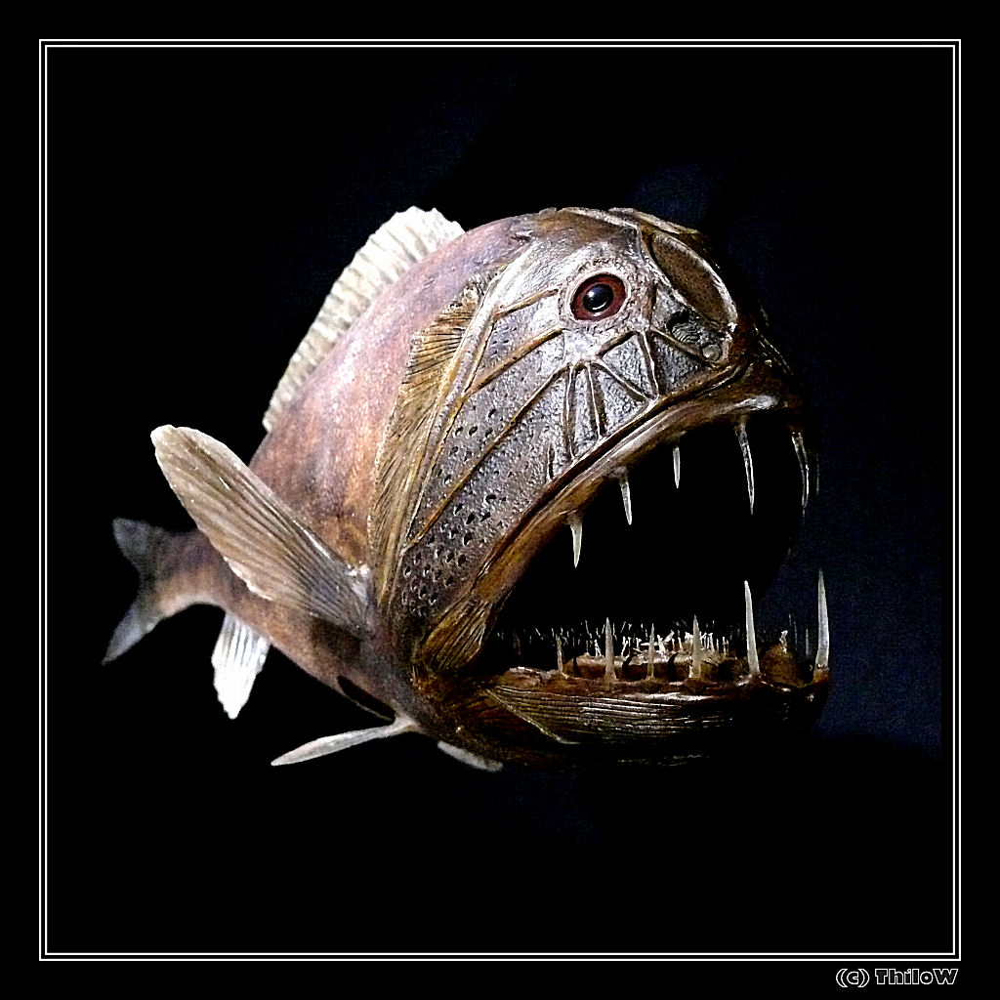


Filtered Image with 2D Convolution


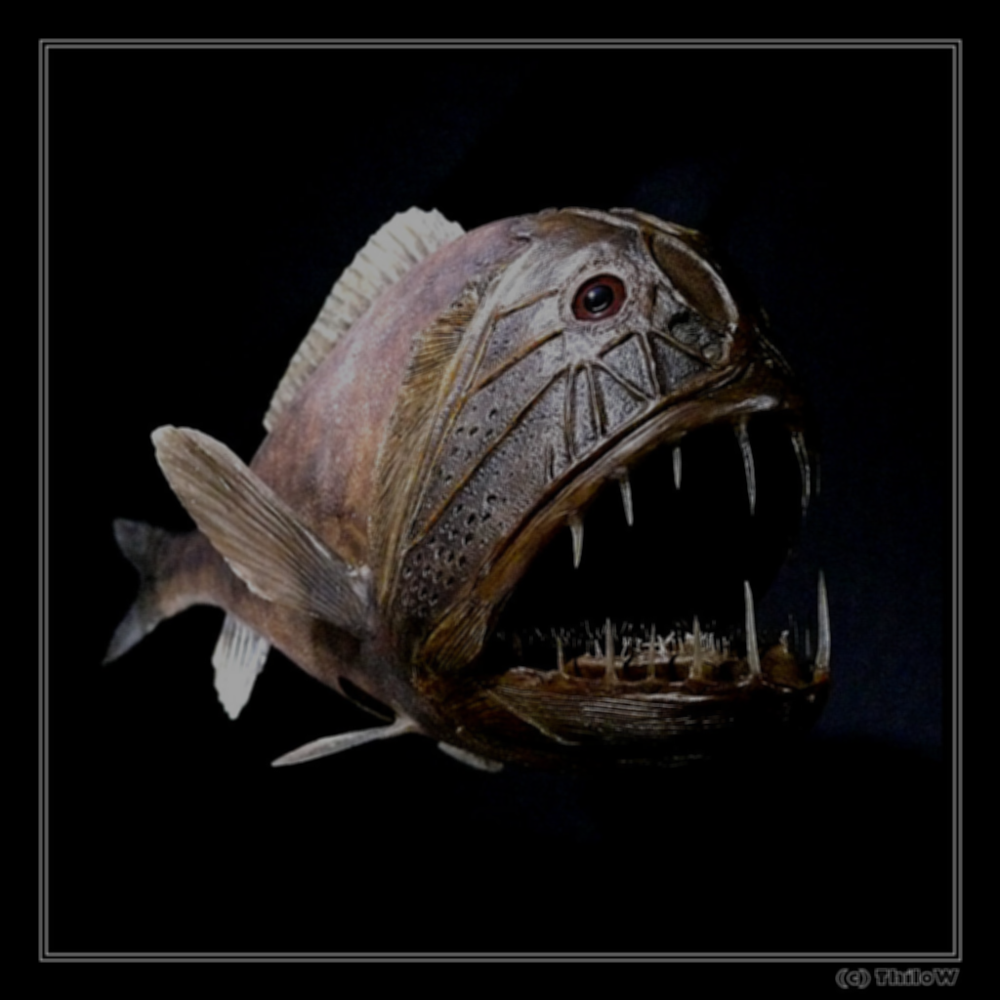

In [12]:
# Image Index 0

print("Original Image")
cv2_imshow(image_set_dir[0])

kernel = np.ones((4, 4), np.float32) / 25
img_2d_convolution = cv.filter2D(image_set_dir[0], -1, kernel)

print("\nFiltered Image with 2D Convolution")
cv2_imshow(img_2d_convolution)

Image Blurring

This is another type of filter that is commonly applied to image, removing high frequency content from the image. It works on the same principle as 2D convolution. There are many types of blurring techniques, but the simplest one is blurring using Averaging, which is used in this example.

It makes use of the blur function: cv.blur() which blurs the content of the image based on a given kernel size.

You can find the specific documentation for this tool here: https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html

Original Image


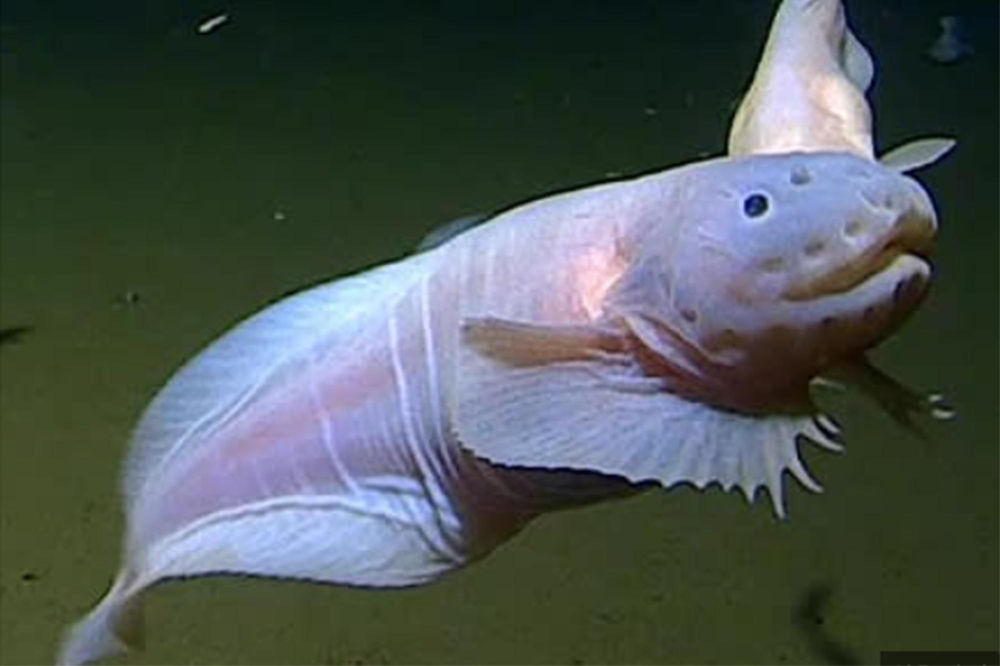


Blurred Image


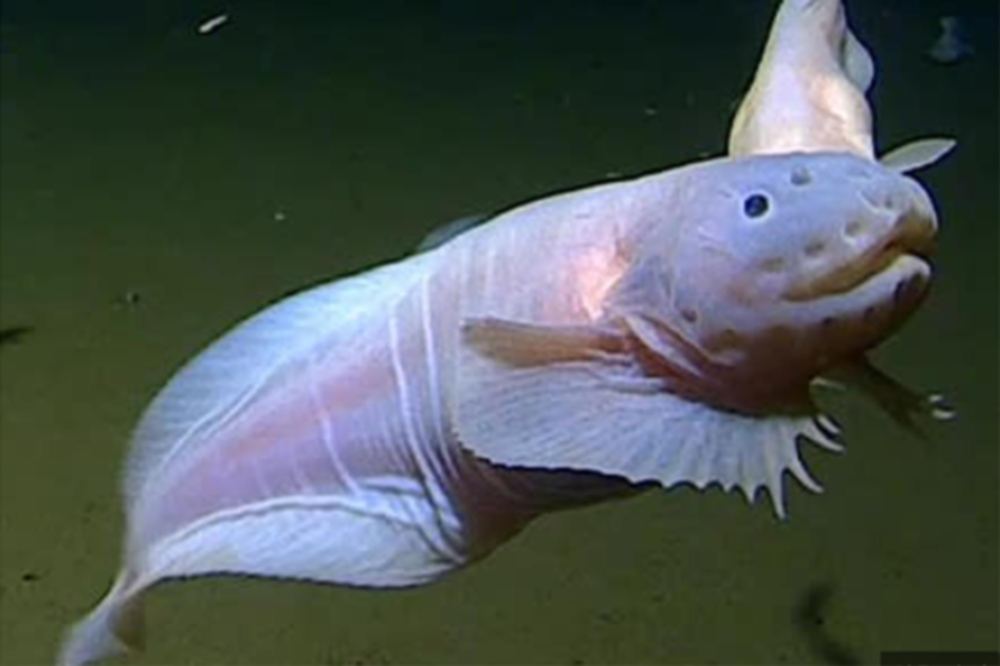

In [13]:
# Image Index 1

print("Original Image")
cv2_imshow(image_set_dir[1])

img_blurred = cv.blur(image_set_dir[1], (6, 6))

print("\nBlurred Image")
cv2_imshow(img_blurred)

Image Histogram

Historgrams are a unique graph that gives an overview of the intensity of the image based on its pixel values and resolution. The left side of the histogram lists the amount of darker pixels in an image, and the right side of the histogram lists the amount of lighter pixels in an image.

We make use of the matplot library in this example since histograms are easier to create and interpret with the use of graphs. We use the functions: plt.hist() and plt.show() to map out the histogram of our target image and display it.

You can find the specific documentation for this tool here: https://docs.opencv.org/4.x/d1/db7/tutorial_py_histogram_begins.html

Original Image


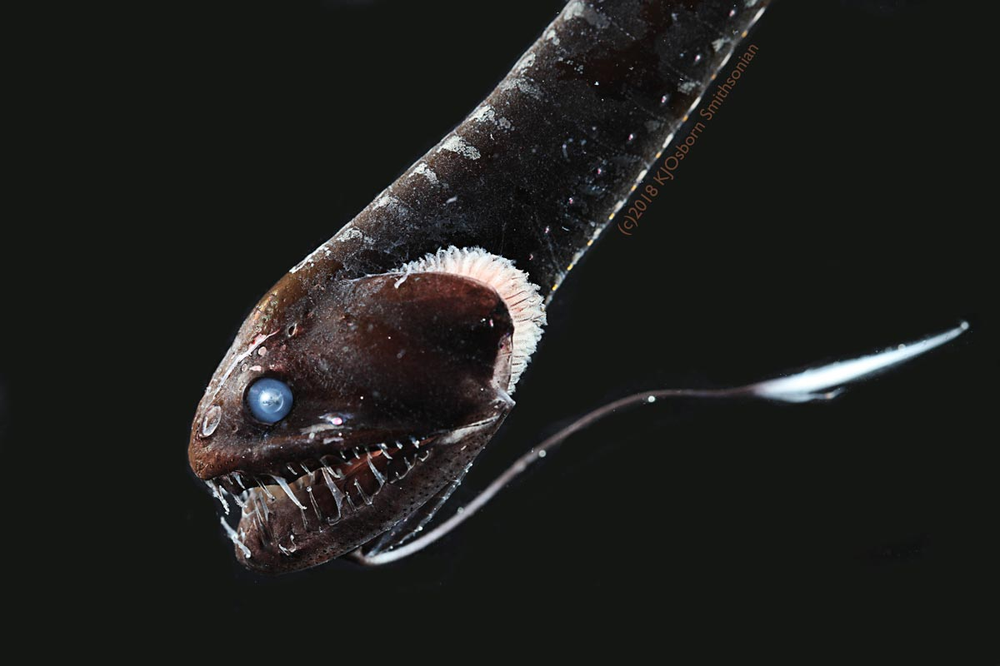


Histogram of the Image


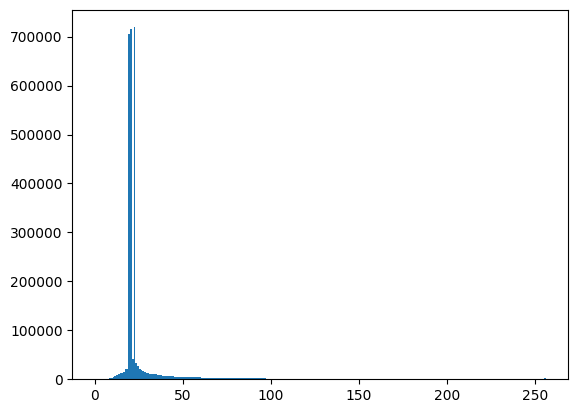

In [14]:
# Image Index 2

print("Original Image")
cv2_imshow(image_set_dir[2])

print("\nHistogram of the Image")
plt.hist(image_set_dir[2].ravel(), 256, [0, 256]); plt.show()

Image Tresholding

Tresholding involves converting an image into grescale and then converting it into a binary image based on the intensity of each pixel value based on a given treshold. This technique makes it much easier to distinguish objects or features in a given image, both in the foreground and background. The example in our code makes use of one type of tresholding, Adapative Tresholding, which attempts to determine the treshold of a pixel based on adjacent pixels. This works well for images which varied lighting conditions.

We make use of two sets of functions for tresholding, the first being the convert function: cv.cvtColor() to convert our target image into greyscale. We then turn it into a binary image using the treshold function: cv.adaptiveThreshold() which turns each pixel into black or white only.

You can find the specific documentation for this tool here: https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html

Original Image


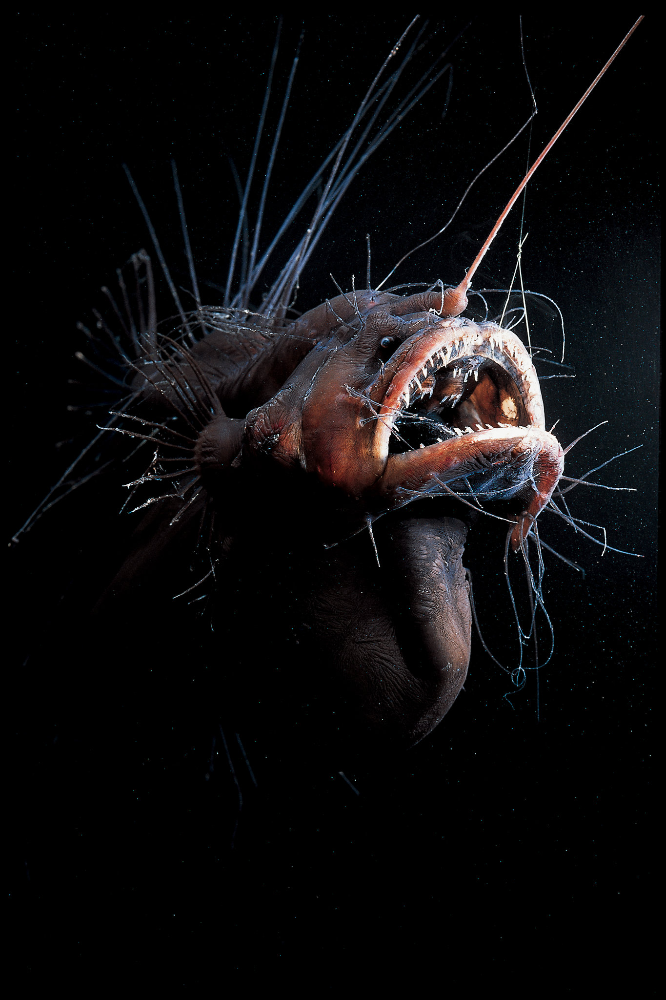


Treshold of the Image


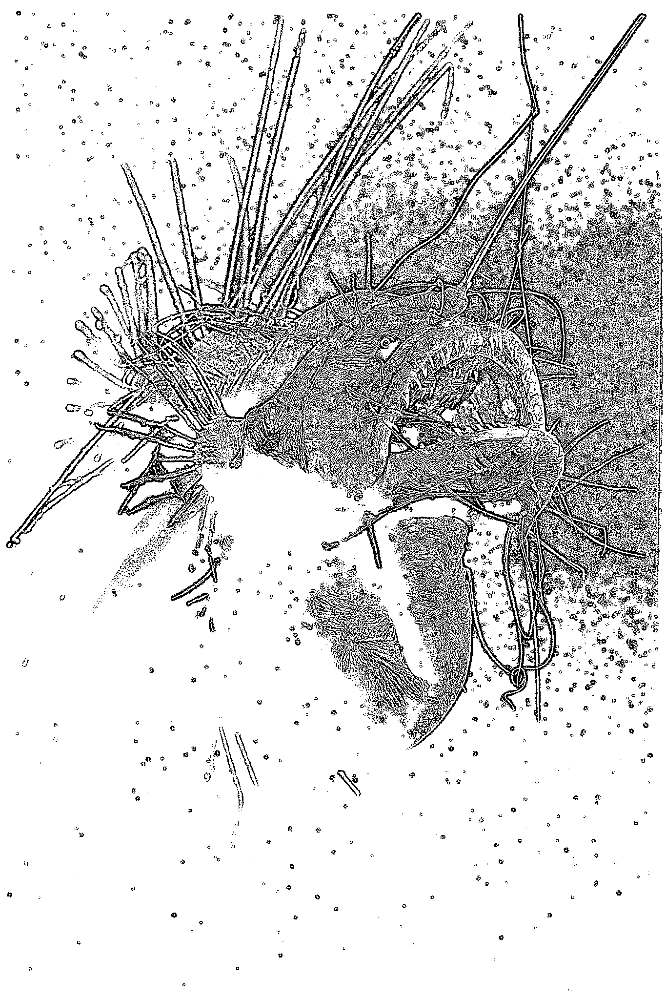

In [15]:
# Image Index 3

print("Original Image")
cv2_imshow(image_set_dir[3])

img_gray = cv.cvtColor(image_set_dir[3], cv.COLOR_BGR2GRAY)
img_treshold = cv.adaptiveThreshold(img_gray, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 11, 2)

print("\nTreshold of the Image")
cv2_imshow(img_treshold)

Image Erosion

Erosion is a type of morphological transformation that gradually erodes borders in the target image. In essence, borders and lines in the image become more prominent when this image preprocessing technique is used.

Similar to blurring and filtering, we make use of a kernel with the numpy function: np.ones() which determines the intensity of the erosion. We then apply the erosion transformation with the erode function: cv.erode() to erode the borders of the image.

You can find the specific documentation for this tool here: https://docs.opencv.org/4.x/d9/d61/tutorial_py_morphological_ops.html

Original Image


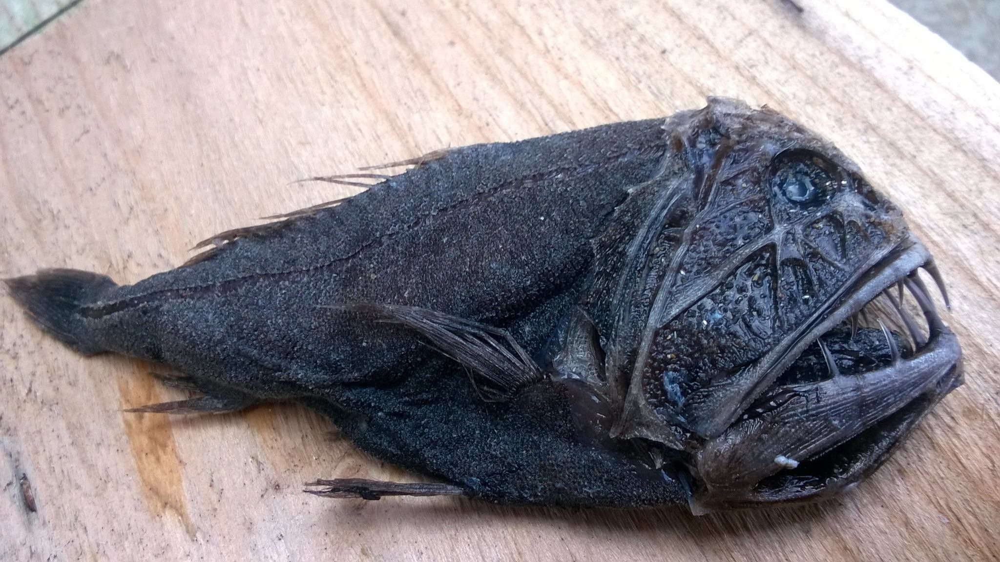


Eroded Image


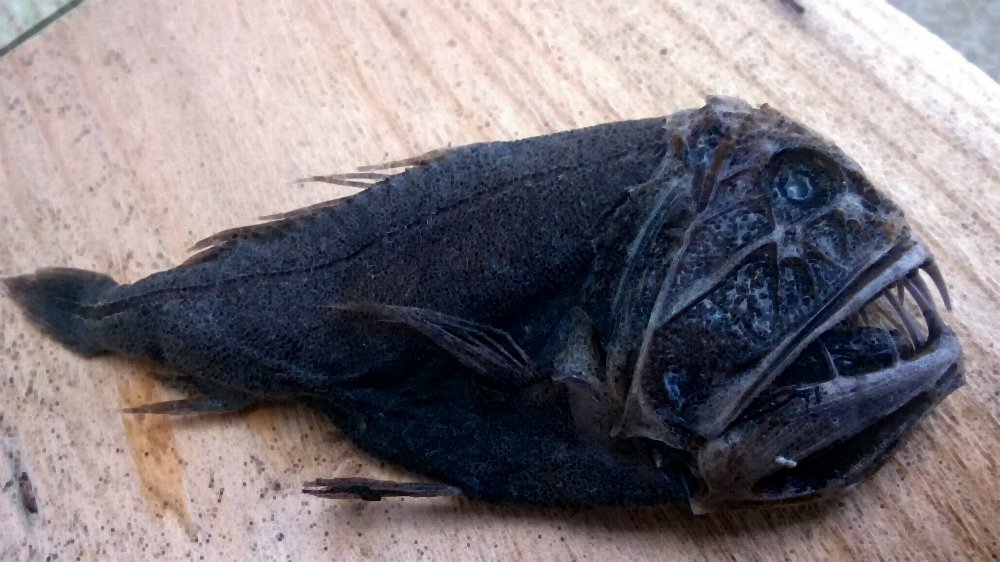

In [16]:
# Image Index 4

print("Original Image")
cv2_imshow(image_set_dir[4])

kernel = np.ones((5, 5), np.uint8)
img_erosion = cv.erode(image_set_dir[4], kernel, iterations = 1)

print("\nEroded Image")
cv2_imshow(img_erosion)

Image Dilation

Dilation is another type of morphological transformation that gradually increases the white regions in the images. This causes the submit matter of the image "pop out" and become more prominent.

Similar to blurring and filtering, we also make use of a kernel with the numpy function: np.ones() which determines the intensity of the dilation. We then apply the dilation transformation with the dilate function: cv.dilate() to dilate the white regions of the image.

You can find the specific documentation for this tool here: https://docs.opencv.org/4.x/d9/d61/tutorial_py_morphological_ops.html

Original Image


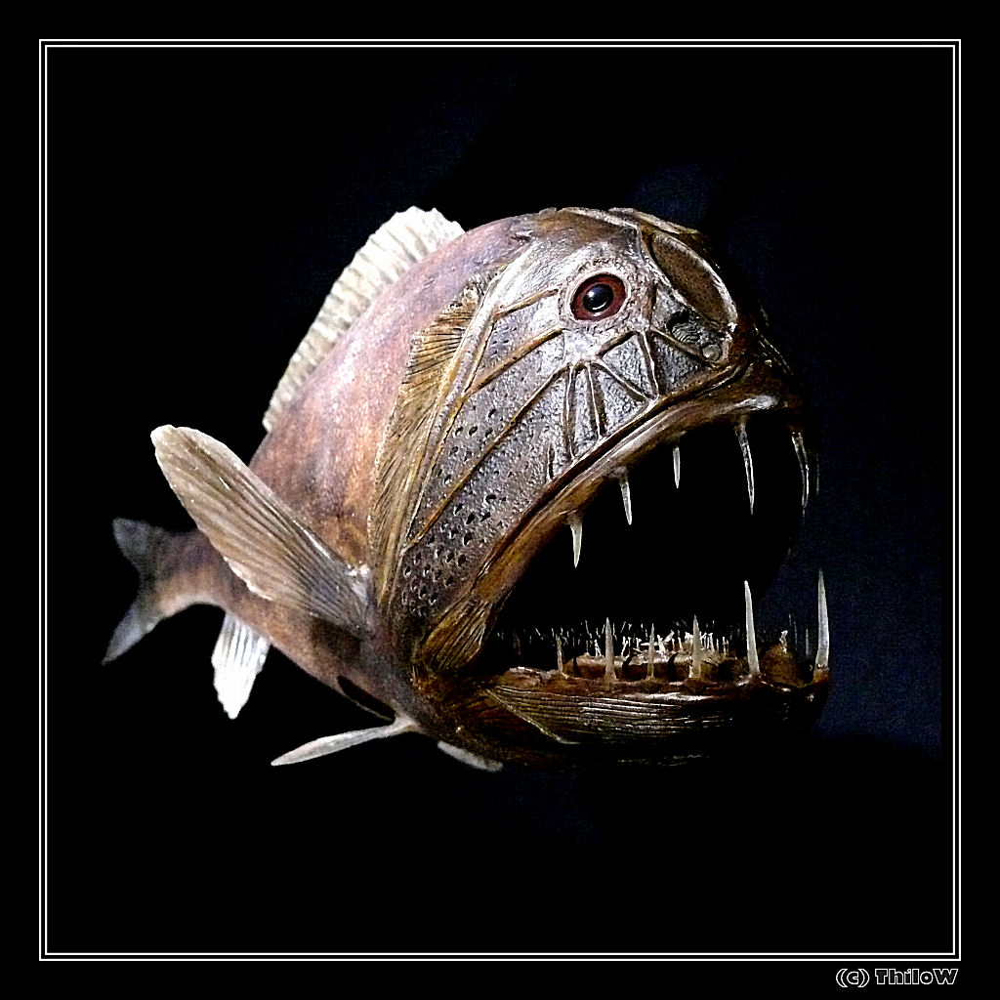


Dilated Image


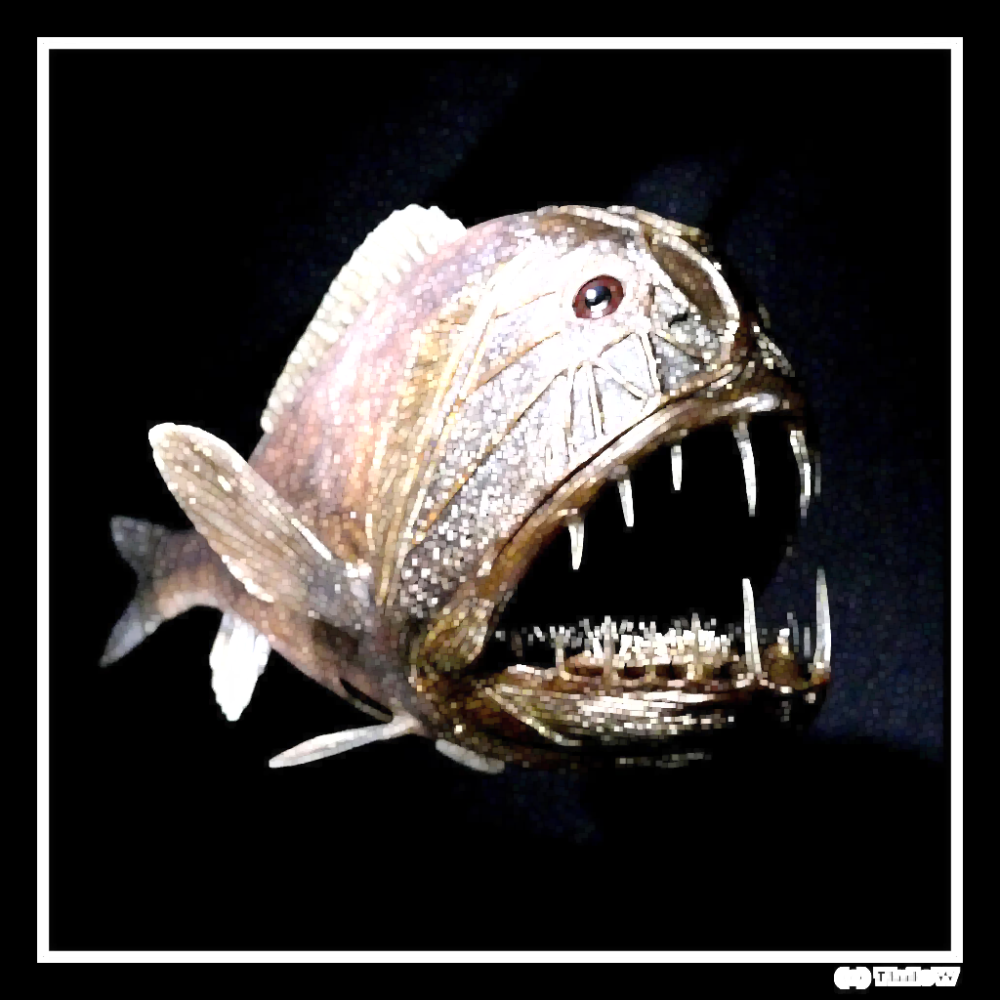

In [17]:
# Image Index 0

print("Original Image")
cv2_imshow(image_set_dir[0])

kernel = np.ones((5, 5), np.uint8)
img_dilation = cv.dilate(image_set_dir[0], kernel, iterations = 1)

print("\nDilated Image")
cv2_imshow(img_dilation)

Morphological Gradient

Morphological gradient is a unique morphological transformation that showcases the difference of dilation and erosion when applied to an image. This creates outlines of the objects in the image and works similarly to image tresholding.

We need to make use of a kernel with the numpy function: np.ones() which determines the intensity of the dilation and erosion that will be applied to the image. We then compute and showcase the difference of the dilation and erosion values using the morphology function: cv.morphologyEx() to create outlines on the target image.

You can find the specific documentation for this tool here: https://docs.opencv.org/4.x/d9/d61/tutorial_py_morphological_ops.html

Original Image


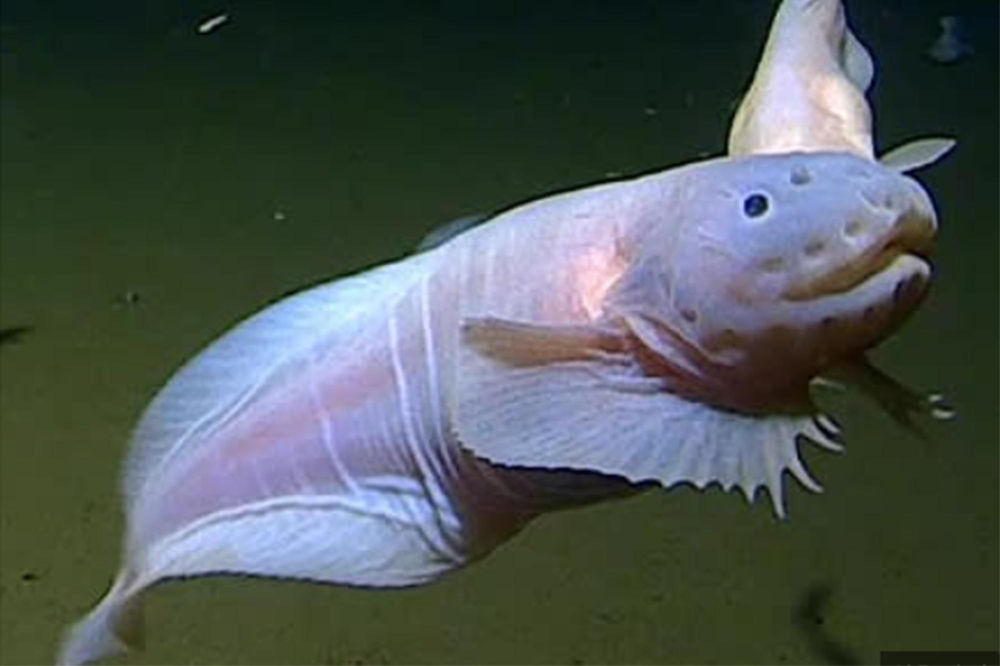


Morphological Gradient Image


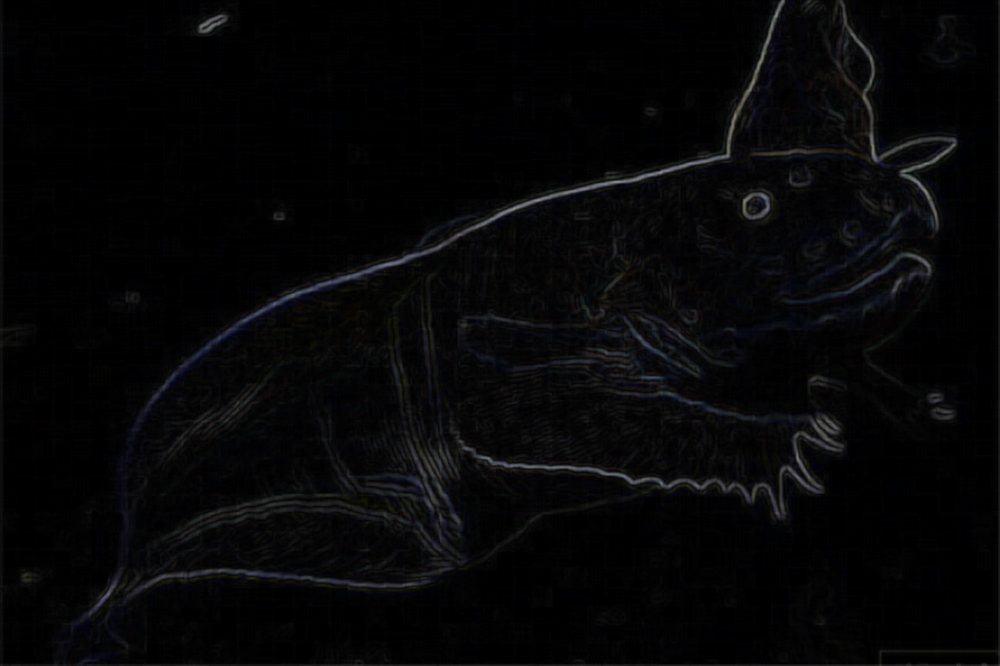

In [18]:
# Image Index 1

print("Original Image")
cv2_imshow(image_set_dir[1])

kernel = np.ones((5, 5), np.uint8)
img_morphological_gradient = cv.morphologyEx(image_set_dir[1], cv.MORPH_GRADIENT, kernel)

print("\nMorphological Gradient Image")
cv2_imshow(img_morphological_gradient)

Applying Multiple Preprocessing Techniques
We can also make use of multiple preprocessing techniques on a single image. This allows us automate using multiple techniques and stack preprocessing effects on one image.

This has benefits, such as allowing us to clean an image, crop, and apply a filter in one set of code. It can also be detrimental, as using too many preprocessing techniques on an image can make it unrecognizable from the original, or degrade the overall quality. How you use this would depend on what type of images you are trying to process along with what goal you want to achieve in your data preprocessing methodology.

# Compiling and Downloading the Images

**Once we have preprocessed our images based on our needs and requirements for our data mining tools and methodology, the last step is to compile our new images and download them for later use.** To demonstrate how this will be done, we will process all of the images in our dataset using different preprocessing techniques and store them in new variables.

**We store the new images into new variables so that it will be easier to distinguish and manage the original, unprocessed images, and the new, processed images.**

In [19]:
# Resize processed image set
processed_image_set = [img_2d_convolution, img_blurred, img_treshold, img_erosion, img_dilation, img_morphological_gradient]
image_set_resized = []

for image in processed_image_set:
    img_resized = cv.resize(image, (224, 224))
    image_set_resized.append(img_resized)

**Once we have processed all our images, the next step is to create a folder in our colab editor where we will write the images to.** This is important as the processed images are currently stored in a variable and not as image files that we can store and download.

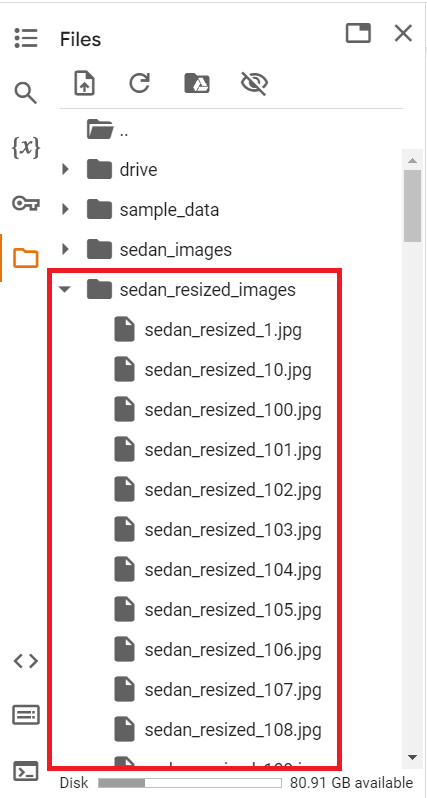

The code below creates new folders in our colab instance, which is where we will be storing our new images. We also will rename our images so that the files will have a consistent naming scheme and be easier to distinguish.




In [20]:
os.mkdir('/content/processed_images')
os.mkdir('/content/processed_images/deep_sea_fish_images')

os.chdir(r'/content/processed_images/deep_sea_fish_images')

counter = 0

for image in image_set_resized:
    counter += 1
    new_name = f"processed_deep_sea_fish_images_{str(counter)}.jpg"
    cv.imwrite(new_name, image)

**To make the contents of the folder easier to download, we will zip the folder, which will allow us to download all its contents as one instead of downloading each image individually.** Running the code below will create a new zip file that contains our preprocessed images.

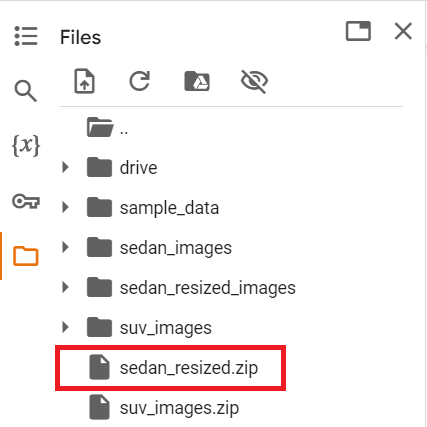

In [21]:
!zip -r '/content/preprocessed_image_set.zip' '/content/processed_images'

  adding: content/processed_images/ (stored 0%)
  adding: content/processed_images/deep_sea_fish_images/ (stored 0%)
  adding: content/processed_images/deep_sea_fish_images/processed_deep_sea_fish_images_6.jpg (deflated 1%)
  adding: content/processed_images/deep_sea_fish_images/processed_deep_sea_fish_images_5.jpg (deflated 9%)
  adding: content/processed_images/deep_sea_fish_images/processed_deep_sea_fish_images_2.jpg (deflated 1%)
  adding: content/processed_images/deep_sea_fish_images/processed_deep_sea_fish_images_4.jpg (deflated 1%)
  adding: content/processed_images/deep_sea_fish_images/processed_deep_sea_fish_images_1.jpg (deflated 8%)
  adding: content/processed_images/deep_sea_fish_images/processed_deep_sea_fish_images_3.jpg (deflated 1%)


**The last step is to simply download the zip file containing our preprocessed images.** Running the code below will download the zip file locally to your system. Make sure your internet connection is stable and working before running this code.

In [22]:
files.download('/content/preprocessed_image_set.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>